State shape: (12,)


<IPython.core.display.Javascript object>


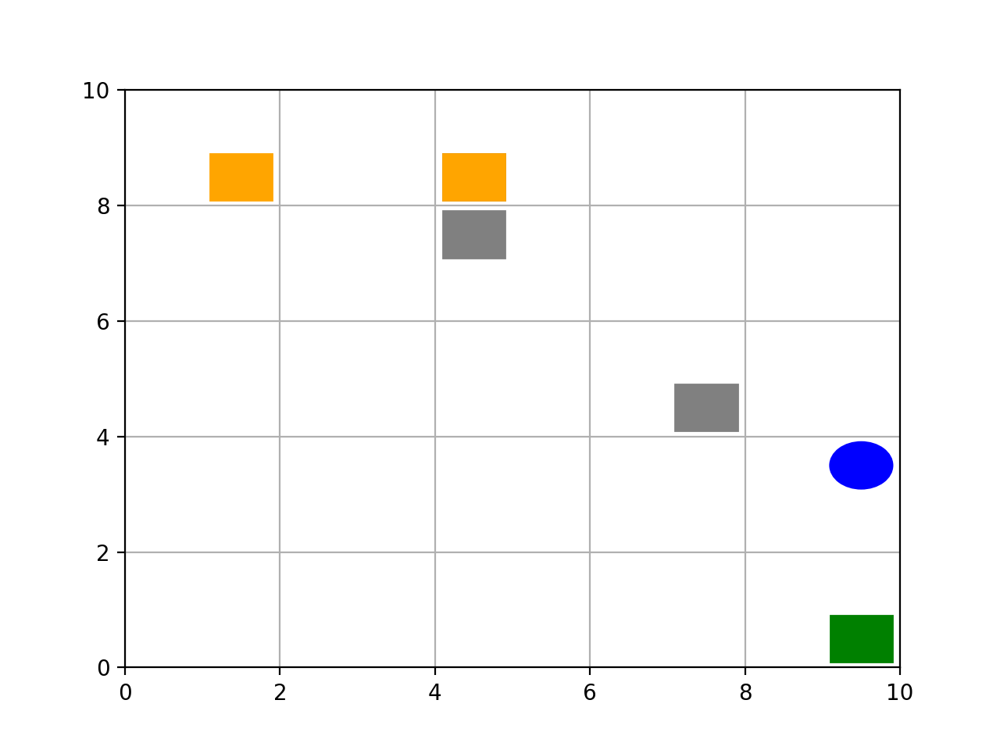

In [1]:

%matplotlib notebook
!pip install tqdm


import gym
from gym import spaces
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.animation import FuncAnimation
import os
from tqdm import tqdm

from IPython.display import HTML

class AdvancedRobotEnv(gym.Env):


    def __init__(self):
        super(AdvancedRobotEnv, self).__init__()
        self.grid_size = 10  # Define the grid size
        self.action_space = spaces.Discrete(4)  # Define the action space (up, down, left, right)
        self.num_static_obstacles = 3  # Define the number of static obstacles
        self.num_dynamic_obstacles = 2  # Define the number of dynamic obstacles
        self.observation_space = spaces.Box(low=0, high=self.grid_size,
                                            shape=(2 + 2 * self.num_static_obstacles + 2 * self.num_dynamic_obstacles,), dtype=np.int32)

        self.state = None  # Initialize the state
        self.goal_position = np.array([self.grid_size - 1, self.grid_size - 1])  # Set the goal position
        self.ani = None  # To keep the reference to the animation

        # Generate static and dynamic obstacles
        self.static_obstacles = [self._random_position() for _ in range(self.num_static_obstacles)]
        self.dynamic_obstacles = [self._random_position() for _ in range(self.num_dynamic_obstacles)]
        self.reset()

    def reset(self):
        """Reset the environment state."""
        self.state = np.array([0, 0])  # Starting position of the robot
        # Add positions of static and dynamic obstacles to the state
        full_state = np.concatenate((self.state, np.array(self.static_obstacles).flatten(), np.array(self.dynamic_obstacles).flatten()))
        return full_state

    def step(self, action):
        """Update the environment state based on an action."""
        # Move the robot
        self.state[:2] = self._move_robot(self.state[:2], action)

        # Update dynamic obstacles
        for i in range(self.num_dynamic_obstacles):
            self.dynamic_obstacles[i] = self._move_obstacle(self.dynamic_obstacles[i])

        # Check for collisions with static and dynamic obstacles
        collision_static = any(np.array_equal(self.state[:2], obstacle) for obstacle in self.static_obstacles)
        collision_dynamic = any(np.array_equal(self.state[:2], obstacle) for obstacle in self.dynamic_obstacles)
        collision = collision_static or collision_dynamic

        # Determine if the goal has been reached
        done = np.array_equal(self.state[:2], self.goal_position)
        reward = self._calculate_reward(done, collision)

        # Concatenate robot position with obstacle positions to form the full state
        full_state = np.concatenate((self.state, np.array(self.static_obstacles).flatten(), np.array(self.dynamic_obstacles).flatten()))
        return full_state, reward, done, {}

    def _random_position(self):
        """Generate a random position within the grid."""
        return np.array([random.randint(0, self.grid_size - 1), random.randint(0, self.grid_size - 1)])

    def _move_robot(self, position, action):
        """Move the robot based on the action."""
        moves = [(-1, 0), (1, 0), (0, -1), (0, 1)]  # up, down, left, right
        new_position = position + moves[action]
        new_position = np.clip(new_position, 0, self.grid_size - 1)
        return new_position.astype(int)

    def _move_obstacle(self, position):
        """Randomly move a dynamic obstacle to a new position."""
        moves = [(-1, 0), (1, 0), (0, -1), (0, 1), (0, 0)]  # Add a stationary move
        move = random.choice(moves)
        new_position = position + move
        new_position = np.clip(new_position, 0, self.grid_size - 1)
        return new_position.astype(int)

    def _check_collision(self):
        """Check if the robot has collided with any obstacle."""
        for obstacle in self.static_obstacles + self.dynamic_obstacles:
            if np.array_equal(self.state[:2], obstacle):
                return True
        return False

    

    def _calculate_reward(self, done, collision):
        if done:
        # High reward for reaching the goal
            return 100
        elif collision:
        # High penalty for collision
            return -10
        else:
            # Calculate normalized distance to the goal
            max_distance = np.sqrt(2 * (self.grid_size ** 2))  # Diagonal distance of the grid
            distance_to_goal = np.linalg.norm(self.state[:2] - self.goal_position)
            normalized_distance = distance_to_goal / max_distance

            # Calculate proximity reward (higher when closer to the goal)
            proximity_reward = (1 - normalized_distance) * 5  

            # Small penalty for each step to encourage efficiency
            return proximity_reward - 1


    def animate_step(self, i, fig, ax):
        """Animation step function."""
        ax.clear()
        ax.set_xlim(0, self.grid_size)
        ax.set_ylim(0, self.grid_size)
        plt.grid()

        # Update robot and obstacles positions
        action = self.action_space.sample()  #Show environment demo
        self.step(action)

        # Draw the robot
        robot = patches.Circle((self.state[1] + 0.5, self.grid_size - self.state[0] - 0.5), 0.4, color='blue')
        ax.add_patch(robot)

        # Draw static obstacles
        for obstacle in self.static_obstacles:
            static = patches.Rectangle((obstacle[1] + 0.1, self.grid_size - obstacle[0] - 0.9), 0.8, 0.8, color='grey')
            ax.add_patch(static)

        # Draw dynamic obstacles
        for obstacle in self.dynamic_obstacles:
            dynamic = patches.Rectangle((obstacle[1] + 0.1, self.grid_size - obstacle[0] - 0.9), 0.8, 0.8, color='orange')
            ax.add_patch(dynamic)

        # Draw the goal
        goal = patches.Rectangle((self.goal_position[1] + 0.1, self.grid_size - self.goal_position[0] - 0.9), 0.8, 0.8, color='green')
        ax.add_patch(goal)

    def start_animation(self, steps=50):
        """Start the environment animation."""
        fig, ax = plt.subplots()
        ani = FuncAnimation(fig, self.animate_step, frames=steps, fargs=(fig, ax), interval=200)
        return HTML(ani.to_jshtml())

# Testing the environment with animation
env = AdvancedRobotEnv()
state = env.reset()
print("State shape:", state.shape)
env.start_animation(steps=50)  # Start the animation


Resuming from checkpoint: dqn_checkpoints/checkpoint_episode_225.h5
Loaded checkpoint from dqn_checkpoints/checkpoint_episode_225.h5


Training Progress:   0%|                                 | 0/24 [00:00<?, ?it/s]2023-12-16 10:52:50.762813: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 9ms/step


Training Progress:   4%|▉                     | 1/24 [04:01<1:32:33, 241.45s/it]

Episode: 227/250, Duration: 241.45s, Steps: 194, Score: 215.09381390212877
1/1 [==============================] - 0s 11ms/step


Training Progress:   8%|█▊                    | 2/24 [09:51<1:51:53, 305.16s/it]

Episode: 228/250, Duration: 349.75s, Steps: 250, Score: 146.24202678361254
1/1 [==============================] - 0s 9ms/step


Training Progress:  12%|██▊                   | 3/24 [15:31<1:52:21, 321.05s/it]

Episode: 229/250, Duration: 339.95s, Steps: 250, Score: 204.325723276597
1/1 [==============================] - 0s 9ms/step


Training Progress:  17%|███▋                  | 4/24 [21:18<1:50:31, 331.58s/it]

Episode: 230/250, Duration: 347.74s, Steps: 250, Score: 259.2864103592076
1/1 [==============================] - 0s 11ms/step


Training Progress:  21%|████▌                 | 5/24 [27:04<1:46:35, 336.60s/it]

Episode: 231/250, Duration: 345.48s, Steps: 250, Score: 290.9267803384908
1/1 [==============================] - 0s 9ms/step


Training Progress:  25%|█████▌                | 6/24 [31:04<1:31:10, 303.91s/it]

Episode: 232/250, Duration: 240.45s, Steps: 185, Score: 280.6654966231558
1/1 [==============================] - 0s 10ms/step


Training Progress:  29%|██████▍               | 7/24 [36:40<1:29:01, 314.19s/it]

Episode: 233/250, Duration: 335.36s, Steps: 250, Score: 174.19026893492753
1/1 [==============================] - 0s 9ms/step


Training Progress:  33%|███████▎              | 8/24 [42:08<1:24:58, 318.64s/it]

Episode: 234/250, Duration: 328.17s, Steps: 250, Score: 231.52823862042894
1/1 [==============================] - 0s 10ms/step


Training Progress:  38%|████████▎             | 9/24 [47:45<1:21:06, 324.43s/it]

Episode: 235/250, Duration: 337.17s, Steps: 250, Score: 163.4670513490097
1/1 [==============================] - 0s 12ms/step


Training Progress:  42%|████████▊            | 10/24 [53:34<1:17:28, 332.01s/it]

Episode: 236/250, Duration: 348.99s, Steps: 250, Score: 68.16314556266852
1/1 [==============================] - 0s 9ms/step


Training Progress:  46%|█████████▋           | 11/24 [59:24<1:13:08, 337.58s/it]

Episode: 237/250, Duration: 350.20s, Steps: 250, Score: 107.49950652500833
1/1 [==============================] - 0s 10ms/step


Training Progress:  50%|█████████▌         | 12/24 [1:05:03<1:07:35, 337.93s/it]

Episode: 238/250, Duration: 338.73s, Steps: 250, Score: 122.63554752273006
1/1 [==============================] - 0s 10ms/step


Training Progress:  54%|██████████▎        | 13/24 [1:10:47<1:02:16, 339.72s/it]

Episode: 239/250, Duration: 343.83s, Steps: 250, Score: 188.37770305855042
1/1 [==============================] - 0s 9ms/step


Training Progress:  58%|████████████▎        | 14/24 [1:16:26<56:34, 339.46s/it]

Episode: 240/250, Duration: 338.85s, Steps: 250, Score: 205.20648400383627
1/1 [==============================] - 0s 9ms/step


Training Progress:  62%|█████████████▏       | 15/24 [1:22:02<50:46, 338.52s/it]

Episode: 241/250, Duration: 336.34s, Steps: 250, Score: 227.14411161087364
1/1 [==============================] - 0s 11ms/step


Training Progress:  67%|██████████████       | 16/24 [1:27:42<45:10, 338.87s/it]

Episode: 242/250, Duration: 339.69s, Steps: 250, Score: 142.79276914342722
1/1 [==============================] - 0s 11ms/step


Training Progress:  71%|██████████████▉      | 17/24 [1:33:43<40:18, 345.48s/it]

Episode: 243/250, Duration: 360.87s, Steps: 250, Score: 87.02485330056983
1/1 [==============================] - 0s 11ms/step


Training Progress:  75%|███████████████▊     | 18/24 [1:39:42<34:58, 349.79s/it]

Episode: 244/250, Duration: 359.83s, Steps: 250, Score: 218.19070361566418
1/1 [==============================] - 0s 10ms/step


Training Progress:  79%|████████████████▋    | 19/24 [1:45:42<29:23, 352.70s/it]

Episode: 245/250, Duration: 359.46s, Steps: 250, Score: 271.59119560807784
1/1 [==============================] - 0s 10ms/step


Training Progress:  83%|█████████████████▌   | 20/24 [1:52:02<24:03, 360.94s/it]

Episode: 246/250, Duration: 380.14s, Steps: 250, Score: 311.0041680484864
1/1 [==============================] - 0s 10ms/step


Training Progress:  88%|██████████████████▍  | 21/24 [1:58:21<18:19, 366.42s/it]

Episode: 247/250, Duration: 379.21s, Steps: 250, Score: 138.9395743580418
1/1 [==============================] - 0s 10ms/step


Training Progress:  92%|███████████████████▎ | 22/24 [2:04:32<12:15, 367.80s/it]

Episode: 248/250, Duration: 371.00s, Steps: 250, Score: 305.387933466828
1/1 [==============================] - 0s 9ms/step


Training Progress:  96%|████████████████████▏| 23/24 [2:09:26<05:45, 345.48s/it]

Episode: 249/250, Duration: 293.42s, Steps: 204, Score: 454.6973841828748
1/1 [==============================] - 0s 9ms/step


Training Progress: 100%|█████████████████████| 24/24 [2:15:30<00:00, 338.77s/it]

Episode: 250/250, Duration: 364.33s, Steps: 250, Score: 316.8172572488286


<IPython.core.display.Javascript object>


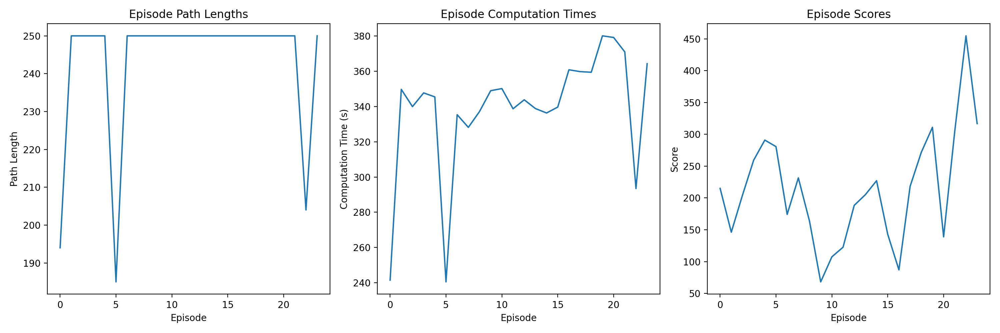

In [3]:
import tensorflow as tf
from tensorflow.keras.optimizers import legacy
from tensorflow.keras import layers, models
import numpy as np
import random
from collections import deque

class DQN:
    def __init__(self, state_size, action_size):
        self.state_size = state_size
        self.action_size = action_size
        self.memory = deque(maxlen=2000)
        self.gamma = 0.95  # discount rate
        self.epsilon = 0.85  # exploration rate
        self.epsilon_min = 0.01
        self.epsilon_decay = 0.99
        self.learning_rate = 0.01
        self.model = self._build_model()
        self.target_model = self._build_model()
        self.update_target_model()

    def _build_model(self):
        # Neural Net for Deep Q-learning Model
        model = models.Sequential()
        model.add(layers.Dense(128, input_shape=(self.state_size,), activation='relu'))
        model.add(layers.Dense(128, activation='relu'))
        model.add(layers.Dense(64, activation='relu'))
        model.add(layers.Dense(self.action_size, activation='linear'))
        model.compile(loss='mse', optimizer=legacy.Adam(learning_rate=self.learning_rate))
        return model

    def update_target_model(self):
        # Copy weights from model to target_model
        self.target_model.set_weights(self.model.get_weights())

    def remember(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))

    def act(self, state):
        if np.random.rand() <= self.epsilon:
            return random.randrange(self.action_size)
        act_values = self.model.predict(state)
        return np.argmax(act_values[0])

    def replay(self, batch_size):
        minibatch = random.sample(self.memory, batch_size)
        for state, action, reward, next_state, done in minibatch:
            target = reward
            if not done:
                target = (reward + self.gamma * np.amax(self.target_model.predict(next_state)[0]))
            target_f = self.model.predict(state)
            target_f[0][action] = target
            self.model.fit(state, target_f, epochs=1, verbose=0)
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

def save_checkpoint(agent, episode, checkpoint_dir='dqn_checkpoints', filename='dqn_checkpoint.h5'):
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
    agent.model.save(os.path.join(checkpoint_dir, f'checkpoint_episode_{episode}.h5'))

# Function to load a checkpoint
def load_checkpoint(agent, filename):
    if not os.path.exists(filename):
        print(f"Checkpoint file {filename} not found.")
        return False
    try:
        agent.model.load_weights(filename)
        agent.update_target_model()
        print(f"Loaded checkpoint from {filename}")
        return True
    except Exception as e:
        print(f"Error loading checkpoint: {e}")
        return False

def find_latest_checkpoint(checkpoint_dir='dqn_checkpoints'):
    checkpoint_files = [f for f in os.listdir(checkpoint_dir) if f.endswith('.h5')]
    if not checkpoint_files:
        return None
    latest_file = max(checkpoint_files, key=lambda x: int(x.split('_')[2].split('.')[0]))
    return os.path.join(checkpoint_dir, latest_file)

    
env = AdvancedRobotEnv()
state_size = env.observation_space.shape[0]  
action_size = env.action_space.n
# Initialize DQN agent
agent = DQN(state_size, env.action_space.n)

latest_checkpoint = find_latest_checkpoint()
if latest_checkpoint:
    print(f"Resuming from checkpoint: {latest_checkpoint}")
    if load_checkpoint(agent, latest_checkpoint):
        # Extract the episode number from the checkpoint filename
        start_episode = int(latest_checkpoint.split('_')[-1].split('.')[0]) + 1
    else:
        start_episode = 0
else:
    print("No checkpoint found, starting from scratch")
    start_episode = 0

EPISODES = 250
BATCH_SIZE = 16

import time

episode_path_lengths = []
episode_computation_times = []
episode_scores = []

for e in tqdm(range(start_episode, EPISODES), desc='Training Progress'):
    start_time = time.time()
    state = env.reset()
    state = np.reshape(state, [1, state_size])
    total_reward = 0

    for time_step in range(250):
        action = agent.act(state)
        next_state, reward, done, _ = env.step(action)
        next_state = np.reshape(next_state, [1, state_size])
        total_reward += reward
        agent.remember(state, action, reward, next_state, done)
        state = next_state

        if done:
            agent.update_target_model()
            break

        if len(agent.memory) > BATCH_SIZE:
            agent.replay(BATCH_SIZE)

    episode_duration = time.time() - start_time
    episode_path_lengths.append(time_step + 1)
    episode_computation_times.append(episode_duration)
    episode_scores.append(total_reward)
    print(f"Episode: {e+1}/{EPISODES}, Duration: {episode_duration:.2f}s, Steps: {time_step + 1}, Score: {total_reward}")

    if e % 25 == 0:
        save_checkpoint(agent, e)

# Plotting results
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.plot(episode_path_lengths)
plt.title('Episode Path Lengths')
plt.xlabel('Episode')
plt.ylabel('Path Length')
plt.subplot(1, 3, 2)
plt.plot(episode_computation_times)
plt.title('Episode Computation Times')
plt.xlabel('Episode')
plt.ylabel('Computation Time (s)')
plt.subplot(1, 3, 3)
plt.plot(episode_scores)
plt.title('Episode Scores')
plt.xlabel('Episode')
plt.ylabel('Score')
plt.tight_layout()
plt.show()
